In [1]:
%%capture
!unset LD_PRELOAD
import os
os.environ.pop('LD_PRELOAD', None)

In [2]:
!cd causal-curiosity/envs && ls

__init__.py  __pycache__  dmc.py  gym.py  skeleton.py


In [3]:
%%bash
cd causal-curiosity
pip install uv uvicorn
uv pip install -r causal-curiosity/requirements.txt 

# setup osmesa cpu backend for mujoco
conda install -c conda-forge mesalib
export MUJOCO_GL=osmesa
export PYOPENGL_PLATFORM=osmesa

error: File not found: `causal-curiosity/requirements.txt`


Channels:
 - conda-forge
 - menpo
 - anaconda
Platform: linux-64
Solving environment: ...working... done




==> WARNING: A newer version of conda exists. <==
    current version: 24.9.1
    latest version: 25.5.1

Please update conda by running

    $ conda update -n base -c conda-forge conda





# All requested packages already installed.



In [4]:
import os
os.environ['MUJOCO_GL'] = 'osmesa'
os.environ['PYOPENGL_PLATFORM'] = 'osmesa'

In [5]:
import os
from dotenv import load_dotenv, find_dotenv

ENV = load_dotenv(find_dotenv())

REPOPATH = os.getenv('REPOPATH', 'causal-curiosity')
print(f"REPOPATH: {REPOPATH}")
os.chdir((os.path.join(REPOPATH, 'notebooks')))
print(f"Current working directory: {os.getcwd()}")

REPOPATH: causal-curiosity
Current working directory: /home/jovyan/causal-curiosity/notebooks


In [6]:
# !nvidia-smi
# !cat /etc/os-release
import torch 

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [9]:
import sys 
import os

sys.path.append(os.path.join('..')) # to find envs.gym
sys.path.append(os.path.join('..', 'envs')) # to find envs.skeleton
sys.path.append(os.path.join('..', 'agent')) # to find encoder, decoder

from envs.gym import Ant
from agent.AE import AutoEncoder2d
from agent.AE import VariationalAutoEncoder2d

(128, 128, 3)


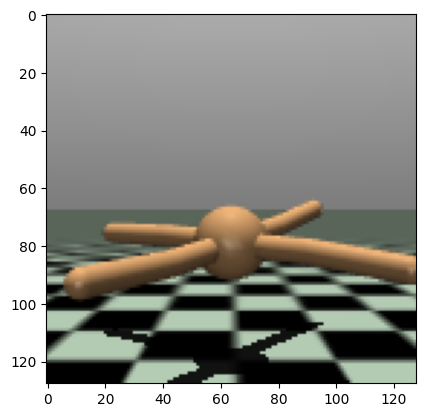

In [10]:
env = Ant(image_states=True, width=128, height=128, render_mode="rgb_array")

frame = env.render()
print(frame.shape)

import matplotlib.pyplot as plt
plt.imshow(frame)

In [11]:
frame = env.render()
print(frame.shape)  # should be (128, 128, 3
print("frame dtype:", frame.dtype)  # should be uint8
print("frame min:", frame.min(), "max:", frame.max())  # should be in [0, 255]

(128, 128, 3)
frame dtype: uint8
frame min: 0 max: 248


In [ ]:
from agent.ae import AutoEncoder2d, VariationalAutoEncoder2d

ImportError: cannot import name 'VariationalAutoEncoder2d' from 'agent.ae' (/home/jovyan/causal-curiosity/notebooks/../agent/ae.py)

In [15]:
from agent.AE import AutoEncoder2d
from agent.AE import VariationalAutoEncoder2d
# ae = AutoEncoder2d(shape=(128, 128, 3), latent_dim=512)
ae = VariationalAutoEncoder2d(shape=(128, 128, 3), latent_dim=512)
ae = ae.to(device)

In [13]:
import torch 
import numpy as np
from tqdm import tqdm

num_steps = 10_000
images = []
for _ in tqdm(range(num_steps), total=num_steps):
    img = env.render()  # shape: (128, 128, 3), dtype: uint8
    images.append(img)
    # env.record()
    action = env.action_space.sample()
    env.step(action)

images = np.stack(images)  # [N, H, W, C]
images = torch.from_numpy(images).permute(0, 3, 1, 2).to(torch.float32).to(device) / 255.0  # [N, C, H, W]

# Ensure images are on the correct device
images = images.to(device)

100%|██████████| 10000/10000 [07:25<00:00, 22.43it/s]


In [14]:
optimizer = torch.optim.Adam(ae.parameters(), lr=6e-4)
criterion = torch.nn.MSELoss()
batch_size = 32
epochs = 10
print(f"Training AutoEncoder with {len(images)} images...")
losses = []
for epoch in tqdm(range(epochs), desc="Training Epochs", total=epochs):
    for i in range(0, len(images), batch_size):
        batch = images[i:i+batch_size]
        recon = ae.forward(batch)
        loss = criterion(recon, batch)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        losses.append(loss.item())
    # print(f"Epoch {epoch}, Loss: {loss.item()}")
    # update the progress bar
    tqdm.write(f"Epoch {epoch+1}/{epochs}, Loss: {loss.item():.6f}")

Training AutoEncoder with 10000 images...


Training Epochs:   0%|          | 0/10 [00:00<?, ?it/s]


TypeError: linear(): argument 'input' (position 1) must be Tensor, not tuple

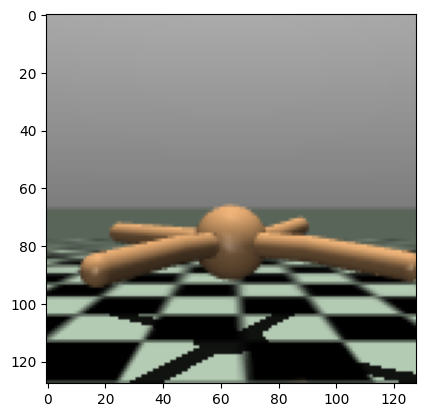

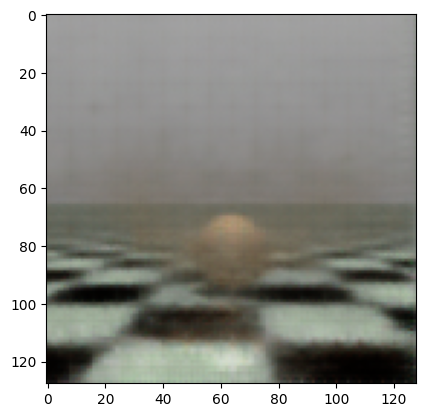

In [ ]:
# To get z for an image:
test_img = images[0].unsqueeze(0)
plt.imshow(test_img[0].permute(1, 2, 0).cpu().numpy())
plt.show()
z = ae.encoder(test_img)  # z is the learned latent representation
x = ae.decoder(z)  # reconstruct the image
plt.imshow(x[0].permute(1, 2, 0).cpu().detach().numpy())
plt.show()

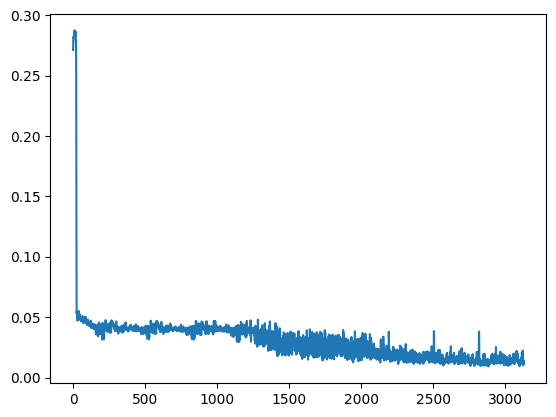

In [ ]:
plt.plot(losses)

In [ ]:
# torch.save(ae.encoder.state_dict(), "../models/encoder.pth")
# torch.save(ae.decoder.state_dict(), "../models/decoder.pth")
# torch.save(ae, "../models/autoencoder.pth")

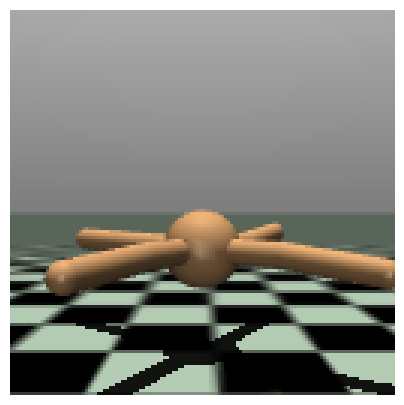

Decoded frame shape: (128, 128, 3)


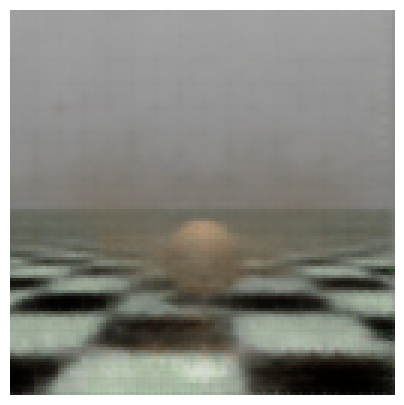

In [ ]:
import matplotlib.pyplot as plt

# print original image
plt.figure(figsize=(5, 5))
plt.axis('off')
plt.imshow(test_img[0].permute(1, 2, 0).detach().cpu().numpy())
plt.show()

frame = ae.decoder(z).detach().cpu().numpy()  # shape: (1, 3, 128, 128)
frame = frame[0].transpose(1, 2, 0)           # shape: (128, 128, 3)
print("Decoded frame shape:", frame.shape)
plt.figure(figsize=(5, 5))
plt.axis('off')
plt.imshow(frame)
plt.show()

In [ ]:
FIRST_K = 50
ae_frames = [ae.decoder(ae.encoder(img.unsqueeze(0))).detach().cpu().numpy()[0].transpose(1, 2, 0) for img in images][:FIRST_K]
frames = [img.permute(1, 2, 0).detach().cpu().numpy() for img in images][:FIRST_K]

In [ ]:
ae_frames[0] == ae_frames[10]

array([[[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False, False, False]],

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False, False, False]],

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False, False, False]],

       ...,

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False, False, False]],

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False,

In [ ]:
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].axis('off')
axes[1].axis('off')
im1= axes[1].imshow(frames[0], animated=True)
im2= axes[0].imshow(ae_frames[0], animated=True)
axes[0].set_title('Original')
axes[1].set_title('Autoencoded')

def animate(i):
    im1.set_array(frames[i])
    im2.set_array(ae_frames[i])
    return [im1, im2]

anim = animation.FuncAnimation(fig, animate, frames=len(frames), interval=50, blit=False)

plt.close(fig)
HTML(anim.to_jshtml())